In [1]:
# Copyright (c) Meta Platforms, Inc. and affiliates.

# Automatically generating object masks with SAM

Since SAM can efficiently process prompts, masks for the entire image can be generated by sampling a large number of prompts over an image. This method was used to generate the dataset SA-1B.

The class `SamAutomaticMaskGenerator` implements this capability. It works by sampling single-point input prompts in a grid over the image, from each of which SAM can predict multiple masks. Then, masks are filtered for quality and deduplicated using non-maximal suppression. Additional options allow for further improvement of mask quality and quantity, such as running prediction on multiple crops of the image or postprocessing masks to remove small disconnected regions and holes.

In [2]:
from IPython.display import display, HTML
display(HTML(
"""
<a target="_blank" href="https://colab.research.google.com/github/facebookresearch/segment-anything/blob/main/notebooks/automatic_mask_generator_example.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>
"""
))

## Environment Set-up

If running locally using jupyter, first install `segment_anything` in your environment using the [installation instructions](https://github.com/facebookresearch/segment-anything#installation) in the repository. If running from Google Colab, set `using_colab=True` below and run the cell. In Colab, be sure to select 'GPU' under 'Edit'->'Notebook Settings'->'Hardware accelerator'.

In [3]:
using_colab = True

In [4]:
if using_colab:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib
    !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'

    !mkdir images
    !wget -P images https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/dog.jpg

    !wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

PyTorch version: 2.6.0+cu124
Torchvision version: 0.21.0+cu124
CUDA is available: True
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-cehg367s
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-cehg367s
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done
  Created wheel for segment_anything: filename=segment_anything-1.0-py3-none-any.whl size=36592 sha256=14b0b8a78aa8192eaed06d4790f850636d30e714ff7813a3b5c12127c91f5e4f
  Stored in directory: /tmp/pip-ephem-wheel-cache-8zadok_9/wheels/15/d7/bd/05f5f23b7dcbe70cbc6783b06f12143b0cf1a5da5c7b52dcc5
Successfully built segment_anything
--2025-04-22 13:33:06--  https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/dog.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com

## Set-up

In [ ]:
import os
import cv2
import numpy as np
import supervision as sv
import ipywidgets as widgets
import matplotlib.pyplot as plt
from IPython.display import display
from jupyter_bbox_widget import BBoxWidget


In [6]:
def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

## Example image

In [7]:
image = cv2.imread('images/dog.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

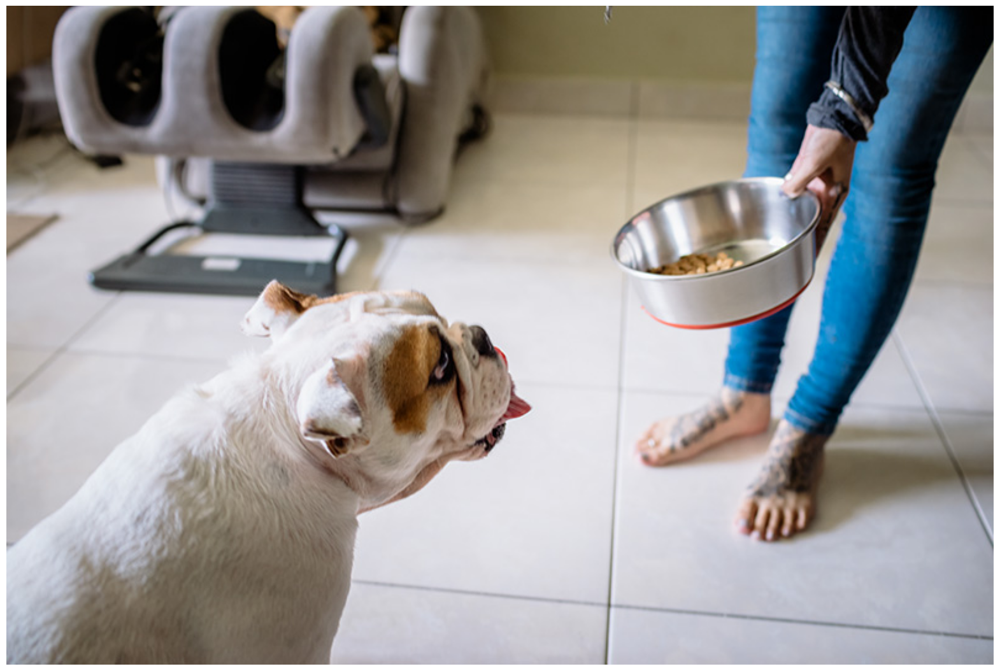

In [8]:
plt.figure(figsize=(20,20))
plt.imshow(image)
plt.axis('off')
plt.show()

## Automatic mask generation

To run automatic mask generation, provide a SAM model to the `SamAutomaticMaskGenerator` class. Set the path below to the SAM checkpoint. Running on CUDA and with the default model is recommended.

In [9]:
import sys
sys.path.append("..")
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

mask_generator = SamAutomaticMaskGenerator(sam)

To generate masks, just run `generate` on an image.

In [10]:
masks = mask_generator.generate(image)

Mask generation returns a list over masks, where each mask is a dictionary containing various data about the mask. These keys are:
* `segmentation` : the mask
* `area` : the area of the mask in pixels
* `bbox` : the boundary box of the mask in XYWH format
* `predicted_iou` : the model's own prediction for the quality of the mask
* `point_coords` : the sampled input point that generated this mask
* `stability_score` : an additional measure of mask quality
* `crop_box` : the crop of the image used to generate this mask in XYWH format

In [11]:
print(len(masks))
print(masks[0].keys())

66
dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


Show all the masks overlayed on the image.

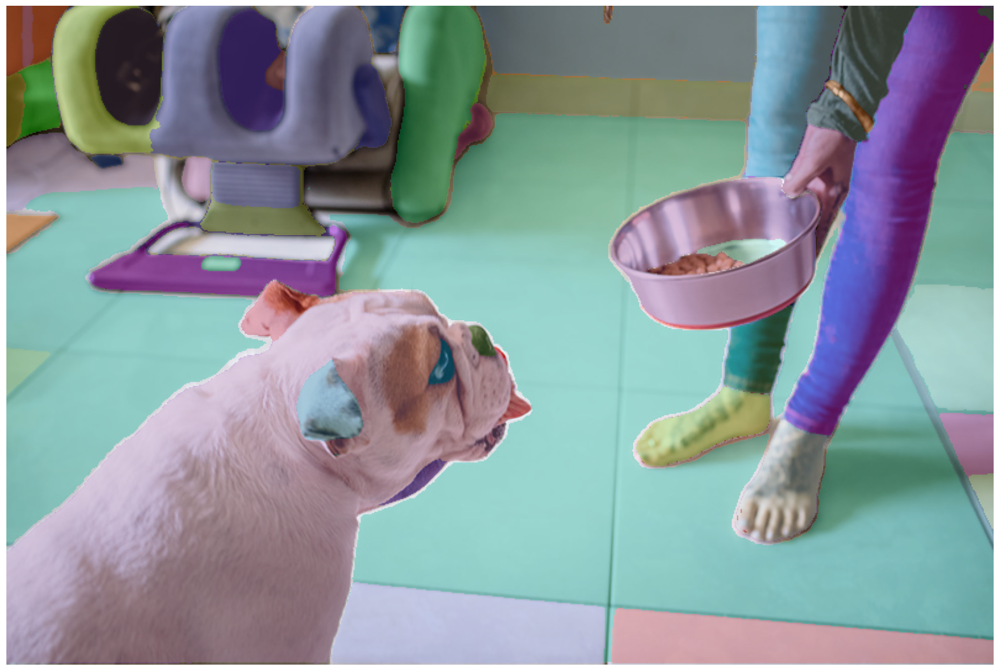

In [12]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show()

## Automatic mask generation options

There are several tunable parameters in automatic mask generation that control how densely points are sampled and what the thresholds are for removing low quality or duplicate masks. Additionally, generation can be automatically run on crops of the image to get improved performance on smaller objects, and post-processing can remove stray pixels and holes. Here is an example configuration that samples more masks:

In [13]:
mask_generator_2 = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=32,
    pred_iou_thresh=0.86,
    stability_score_thresh=0.92,
    crop_n_layers=1,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=100,  # Requires open-cv to run post-processing
)

In [14]:
masks2 = mask_generator_2.generate(image)

In [15]:
len(masks2)

90

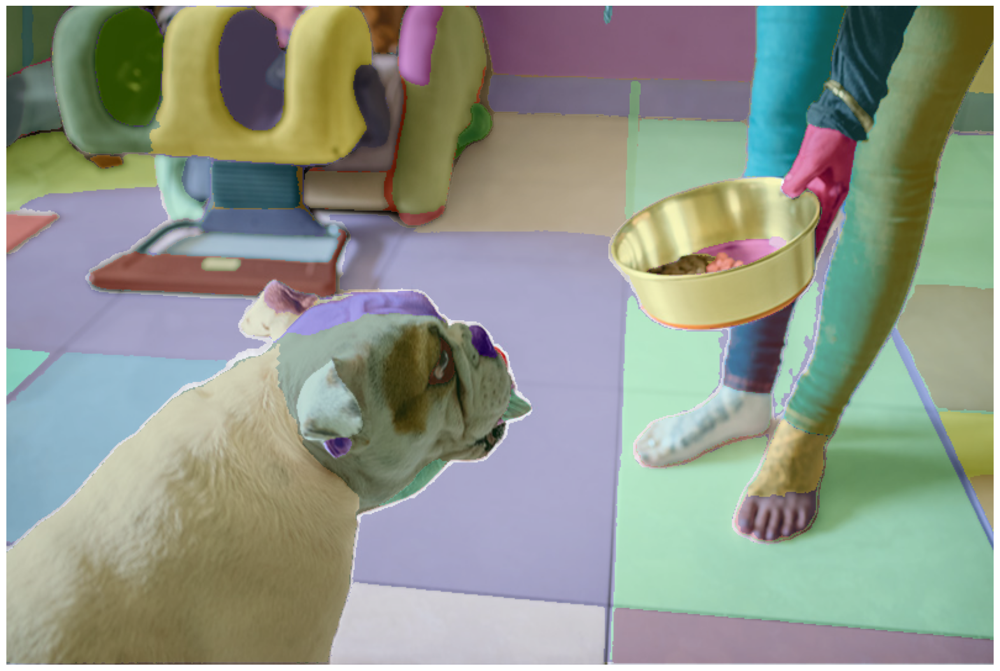

In [16]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks2)
plt.axis('off')
plt.show()

# **Creating Masks on Compiled Images**

**Mounting Google Drive**

In [17]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Preprocessing Images**

In [ ]:
input_dir = '/content/drive/MyDrive/rock_carvings/compiled_images'
output_dir = '/content/drive/MyDrive/rock_carvings/preprocessed_images'
os.makedirs(output_dir, exist_ok=True)

# Preprocessing functions
def apply_clahe(img):
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)
    lab = cv2.merge((cl, a, b))
    return cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)

def adjust_gamma(img, gamma=1.2):
    invGamma = 1.0 / gamma
    table = np.array([(i / 255.0) ** invGamma * 255 for i in np.arange(0, 256)]).astype("uint8")
    return cv2.LUT(img, table)

def preprocess_image(img):
    img = apply_clahe(img)
    img = adjust_gamma(img, gamma=1.2)
    return img

image_paths = [f for f in os.listdir(input_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

for fname in image_paths:
    in_path = os.path.join(input_dir, fname)
    out_path = os.path.join(output_dir, fname)

    img_bgr = cv2.imread(in_path)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    processed = preprocess_image(img_rgb)

    processed_bgr = cv2.cvtColor(processed, cv2.COLOR_RGB2BGR)
    cv2.imwrite(out_path, processed_bgr)

print(f"Saved {len(image_paths)} preprocessed images to {output_dir}")

**Running SAM VIT on the Images**

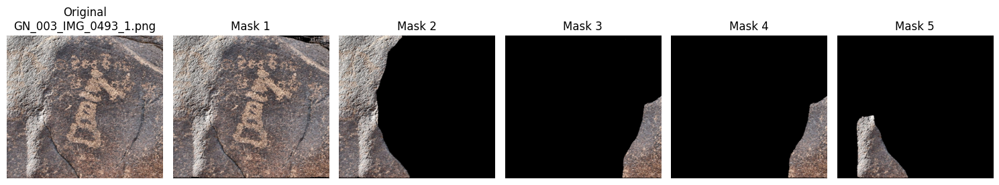

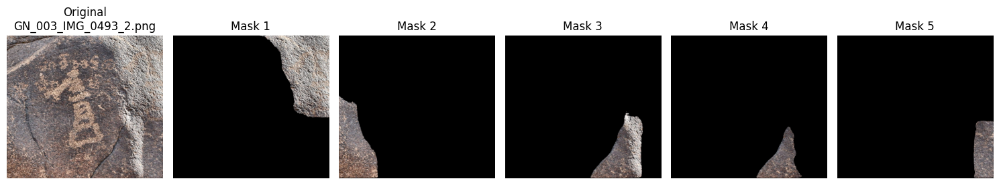

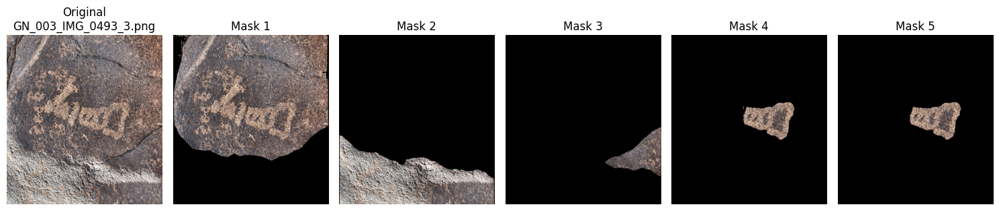

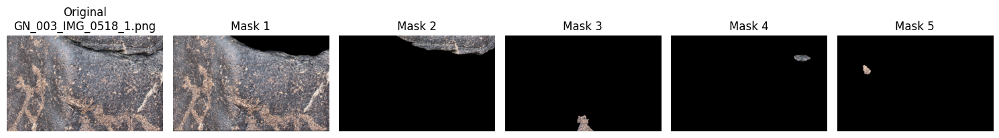

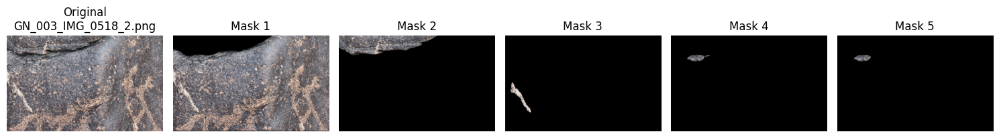

In [20]:
import os
import cv2
import sys
import torch
import numpy as np
import matplotlib.pyplot as plt
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator

# Load SAM
sys.path.append("..")
sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"
device = "cuda" if torch.cuda.is_available() else "cpu"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)
mask_generator = SamAutomaticMaskGenerator(sam)

# Load and process images
input_folder = "/content/drive/MyDrive/preprocessed_images"
image_filenames = sorted(os.listdir(input_folder))[:5]

for filename in image_filenames:
    image_path = os.path.join(input_folder, filename)
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    masks = mask_generator.generate(image_rgb)

    # Sort masks by area (descending)
    masks = sorted(masks, key=lambda x: x['area'], reverse=True)
    top_masks = masks[:5]  # Change this if you want more/fewer masks

    # Display original and top masks
    plt.figure(figsize=(15, 3))
    plt.subplot(1, 6, 1)
    plt.imshow(image_rgb)
    plt.title(f"Original\n{filename}")
    plt.axis("off")

    for i, mask in enumerate(top_masks):
        masked_img = image_rgb.copy()
        masked_img[~mask["segmentation"]] = 0

        plt.subplot(1, 6, i + 2)
        plt.imshow(masked_img)
        plt.title(f"Mask {i+1}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()


# **Creating Bounding Boxes to Generate Masks**

**Installing Dependencies**

In [ ]:
# !pip install supervision
# !pip install jupyter-bbox-widget
# !pip install opencv-python


In [ ]:
from google.colab import drive
import os

# Mount your Google Drive
drive.mount('/content/drive')

# Path to your folder
folder_path = "/content/drive/MyDrive/preprocessed_images"

# List image files (jpg, png)
image_files = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Sort and take first 5 images
image_files = sorted(image_files)[:5]

print("First 5 images:", image_files)


**Initializing the Mask Predictor**

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)
mask_predictor = SamPredictor(sam)


**Creating Bounding Boxes to Get Masks**

In [ ]:
def encode_image(filepath):
    with open(filepath, 'rb') as f:
        image_bytes = f.read()
    encoded = str(base64.b64encode(image_bytes), 'utf-8')
    return "data:image/jpg;base64," + encoded

image_path = image_files[0]  # change index for next images
image_bgr = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Create widget and display image
widget = BBoxWidget()
widget.image = encode_image(image_path)
button = widgets.Button(description="Generate Mask")

output = widgets.Output()

def on_button_clicked(b):
    with output:
        clear_output(wait=True)
        if not widget.bboxes:
            print("Please draw a bounding box first.")
            return
        box = widget.bboxes[0]
        box_array = np.array([box['x'], box['y'], box['x'] + box['width'], box['y'] + box['height']])

        # Run SAM prediction
        mask_predictor.set_image(image_rgb)
        masks, scores, logits = mask_predictor.predict(box=box_array, multimask_output=True)

        # Annotate results
        box_annotator = sv.BoxAnnotator(color=sv.Color.RED, color_lookup=sv.ColorLookup.INDEX)
        mask_annotator = sv.MaskAnnotator(color=sv.Color.RED, color_lookup=sv.ColorLookup.INDEX)

        detections = sv.Detections(xyxy=sv.mask_to_xyxy(masks=masks), mask=masks)
        detections = detections[detections.area == np.max(detections.area)]

        source_image = box_annotator.annotate(scene=image_bgr.copy(), detections=detections)
        segmented_image = mask_annotator.annotate(scene=image_bgr.copy(), detections=detections)

        sv.plot_images_grid(
            images=[source_image, segmented_image],
            grid_size=(1, 2),
            titles=['source image', 'segmented image']
        )

button.on_click(on_button_clicked)

display(widget, button, output)


BBoxWidget(colors=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#b…

Button(description='Generate Mask', style=ButtonStyle())

Output()